In [13]:
!pip install segmentation-models-pytorch
!pip install timm

In [15]:
import cv2
import torch
import kagglehub
import numpy as np

from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torchvision.transforms import v2
import torchvision.transforms.functional as TF
from torchvision.io import decode_image
from torch.utils.data import random_split

from matplotlib import pyplot as plt
import matplotlib.patches as patches

from tqdm import tqdm

import os
from glob import glob
import json

import segmentation_models_pytorch as smp

DEVICE = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
DEVICE

'cuda'

In [16]:
INPUT_DIR = "/kaggle/input/chest-xray-pneumonia/chest_xray/test/NORMAL"
OUTPUT_DIR = "/kaggle/working/weak_masks"
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [17]:
def generate_weak_mask_cxr(img_path):
    # 1. carregar
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    h, w = img.shape
    img = cv2.resize(img, (512, 512))
    
    img[img < 50] = 255 
    img[img > 180] = 255
    
    # 2. equalização + suavização
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    I = clahe.apply(img)
    I = cv2.GaussianBlur(I, (7,7), 0)
    
    for ang in np.arange(0, 151, 30):
        se = np.zeros((15, 15), np.uint8)
        cv2.ellipse(se, (15//2, 15//2), (15//2, 1), ang, 0, 360, 1, -1)
        I_supp = cv2.morphologyEx(I, cv2.MORPH_OPEN, se)
        I = cv2.min(I, I_supp)
        
    # 3. inverter para que opacidades fiquem claras
    I_inv = cv2.normalize(255 - I, None, 0, 255, cv2.NORM_MINMAX)

    # 4. opções de threshold (escolha uma)
    _, bw = cv2.threshold(I_inv, 127, 255, cv2.THRESH_BINARY)
    
    # 5. limpar regiões fora dos pulmões
    # remove um pequeno pedaço do topo e das laterais que não incluem o pulmão (geralmente)
    bw[:40, :], bw[:, -70:], bw[:, :70] = 0,0, 0
    
    # 6. morfologia para suavizar
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,9))
    bw = cv2.morphologyEx(bw, cv2.MORPH_OPEN, kernel)
    bw = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel)
    
    # 7. manter regiões internas
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(bw)
    mask_out = np.zeros_like(bw)
    
    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        x,y = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP]
        wc,hc = stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]

        # descarta regiões no topo e muito pequenas
        if area > 500 and y > 39:
            mask_out[labels == i] = 255
    
    # 8. voltar ao tamanho original
    mask_out = cv2.resize(mask_out, (w, h))
    return (mask_out > 0).astype(np.uint8)

In [18]:
class SelfSegDataset(Dataset):
    def __init__(self, dataset_path=INPUT_DIR, image_size=None):

        self._path_data = dataset_path

        self.data = glob(os.path.join(self._path_data, "**", "*.jpeg"), recursive=True)

        # self.device = device

        if image_size:
            self.resize_image = v2.Resize(size=image_size, interpolation=v2.InterpolationMode.BILINEAR, antialias=True)
            self.resize_mask = v2.Resize(size=image_size, interpolation=v2.InterpolationMode.NEAREST)
        else:
            self.resize_image = lambda x: x
            self.resize_mask = lambda x: x

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        image_path = self.data[index]

        # image = decode_image(image_path).to(self.device)
        image = decode_image(image_path)
        
        # Se tiver 3 canais, reduz para 1 canal
        if image.ndim == 3 and image.shape[0] == 3:
            image = image.mean(dim=0, keepdim=True)

        image = image.float() / 255.0
        image = self.resize_image(image)
        
        # mask = generate_weak_mask_cxr(image_path)
        # image = self.resize_image(image)
        # mask = self.resize_mask(mask)
        # mask = self.resize_mask(mask)

        # Gera máscara fraca 
        mask_np = generate_weak_mask_cxr(image_path)  # -> numpy (H,W)
        mask = torch.tensor(mask_np, dtype=torch.float32).unsqueeze(0)

        mask = self.resize_mask(mask)
        mask = (mask > 0.5).float()  # binarizar sempre

        return image, mask

    def orig_image(self, index):
        image_path = self.data[index]
        return decode_image(image_path)

In [19]:
# Gera máscaras binárias de 0 ou 255.
for filename in tqdm(os.listdir(INPUT_DIR)):
    # if filename.lower().endswith(".png":
        img_path = os.path.join(INPUT_DIR, filename)
        mask = generate_weak_mask_cxr(img_path)
        cv2.imwrite(os.path.join(OUTPUT_DIR, filename.rsplit(".",1)[0] + ".png"), (mask*255))

100%|██████████| 234/234 [00:06<00:00, 35.33it/s]


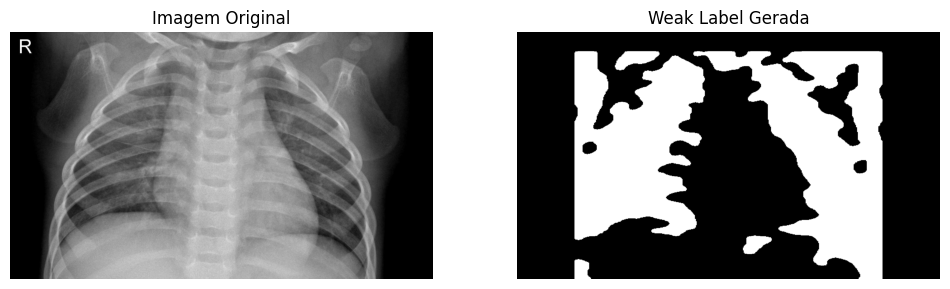

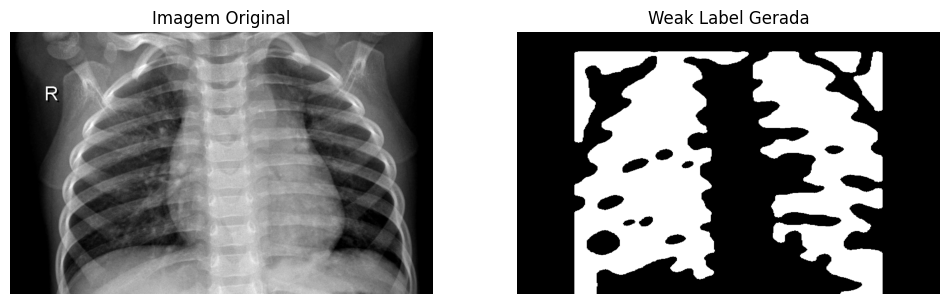

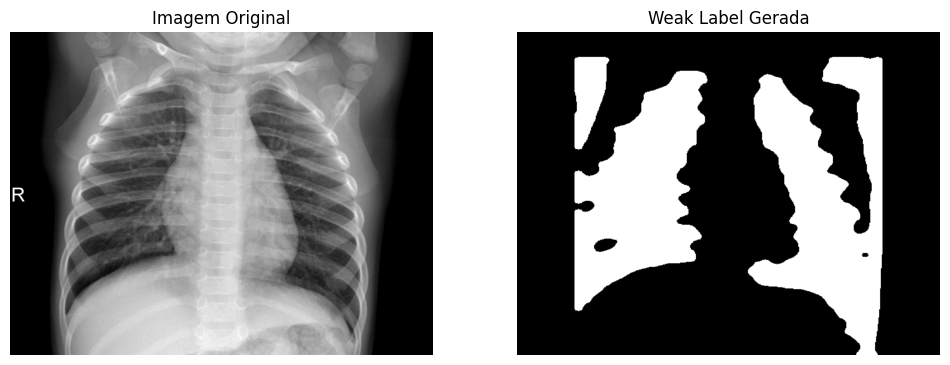

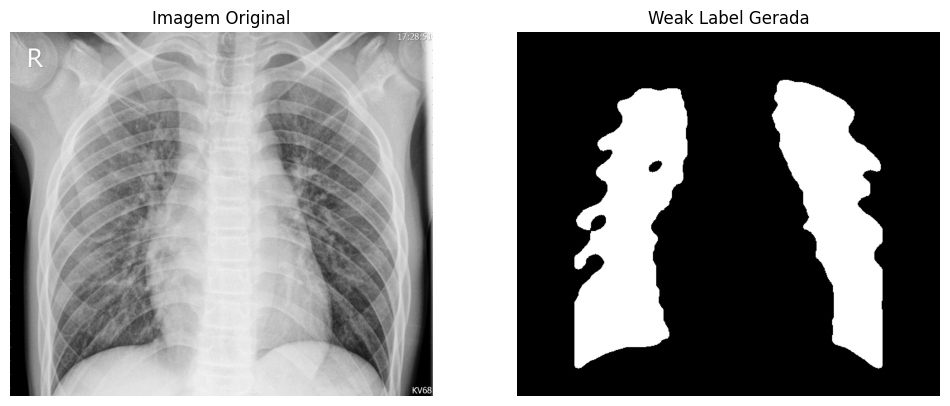

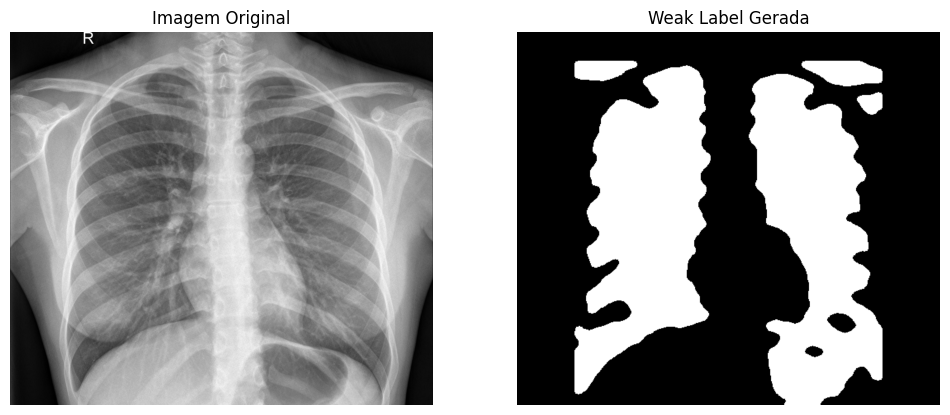

In [20]:
ds = SelfSegDataset()

for i in range(5):
    img, mask = ds[i]
    
    plt.figure(figsize=(12,6))
    
    # --- imagem ---
    plt.subplot(1,2,1)
    plt.title("Imagem Original")
    plt.imshow(img[0].cpu().numpy(), cmap="gray")  # OK
    plt.axis("off")
    
    # --- mask ---
    plt.subplot(1,2,2)
    plt.title("Weak Label Gerada")
    plt.imshow(mask.squeeze().cpu().numpy(), cmap="gray")
    plt.axis("off")
    
plt.show()

### Usando UNet com ativação Sigmóide para treinar as Weak Labels

In [21]:
model = smp.Unet(
    encoder_name="resnet34",       # backbone
    encoder_weights="imagenet",     # opcional
    in_channels=1,                  # suas radiografias são 1 canal
    classes=1,                      # saída de 1 canal
    activation="sigmoid"            # exatamente como você quer
)

In [22]:
# Função de perda Soft Dice Loss
loss = smp.losses.DiceLoss(mode="binary")

In [23]:
dataset = SelfSegDataset(image_size=(512,512))
train_loader = DataLoader(dataset, batch_size=4, shuffle=True)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)

In [24]:
from torchvision.utils import save_image

save_dir = "/kaggle/working/new_weak_labels"
os.makedirs(save_dir, exist_ok=True)

for epoch in range(20):
    model.train()
    total = 0

    for i, (imgs, masks) in enumerate(train_loader):
        imgs = imgs.to(device)
        masks = masks.to(device)

        preds = model(imgs)     # já com sigmoide
        loss_value = loss(preds, masks)

        optimizer.zero_grad()
        loss_value.backward()
        optimizer.step()

        total += loss_value.item()

        # salva apenas as primeiras 1 ou 2 do batch
        n_to_save = 1  
        for k in range(n_to_save):
            save_image(
                imgs[k],
                f"{save_dir}/epoch{epoch+1}_batch{i}_img{k}.png",
                normalize=True
            )

            save_image(
                masks[k],
                f"{save_dir}/epoch{epoch+1}_batch{i}_mask{k}.png",
                normalize=False
            )

            save_image(
                preds[k],
                f"{save_dir}/epoch{epoch+1}_batch{i}_pred{k}.png",
                normalize=True
            )

    print(f"Epoch {epoch+1}: loss = {total / len(train_loader):.4f}")

Epoch 1: loss = 0.5491
Epoch 2: loss = 0.5266
Epoch 3: loss = 0.5201
Epoch 4: loss = 0.5153
Epoch 5: loss = 0.5122
Epoch 6: loss = 0.5102
Epoch 7: loss = 0.5084
Epoch 8: loss = 0.5088
Epoch 9: loss = 0.5076
Epoch 10: loss = 0.5054
Epoch 11: loss = 0.5054
Epoch 12: loss = 0.5064
Epoch 13: loss = 0.5053
Epoch 14: loss = 0.5043
Epoch 15: loss = 0.5035
Epoch 16: loss = 0.5026
Epoch 17: loss = 0.5031
Epoch 18: loss = 0.5029
Epoch 19: loss = 0.5020
Epoch 20: loss = 0.5018


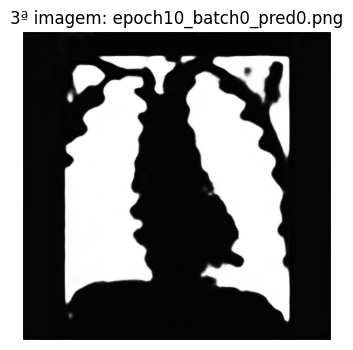

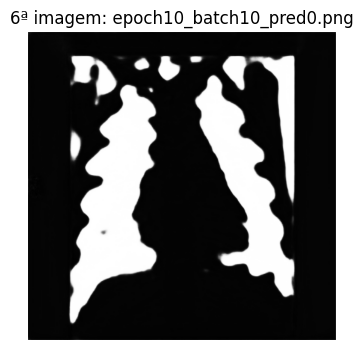

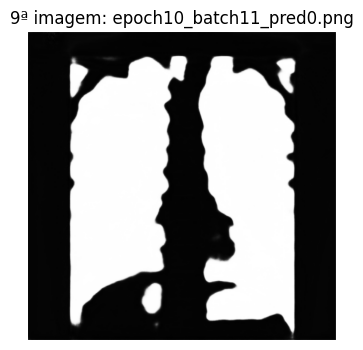

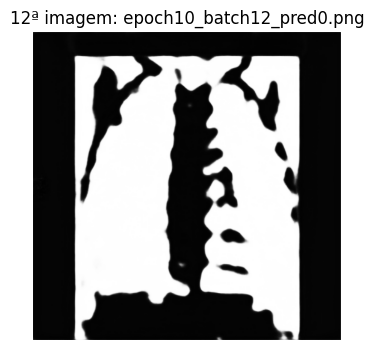

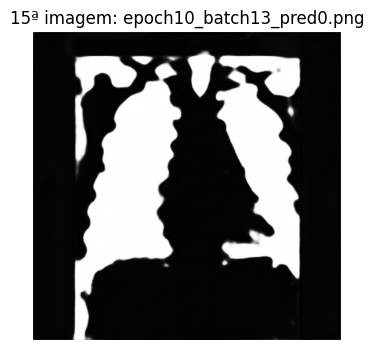

...

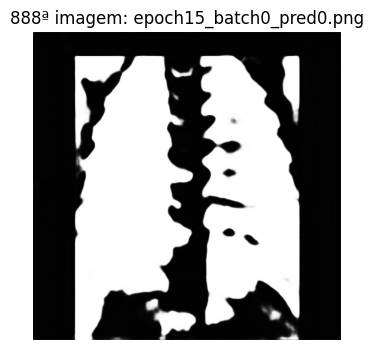

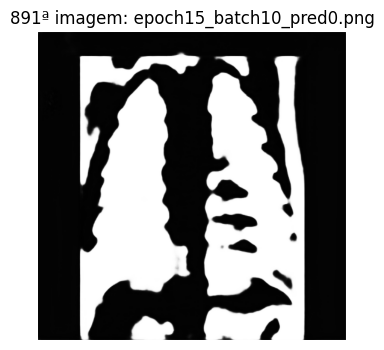

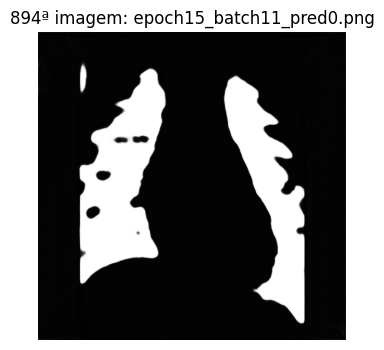

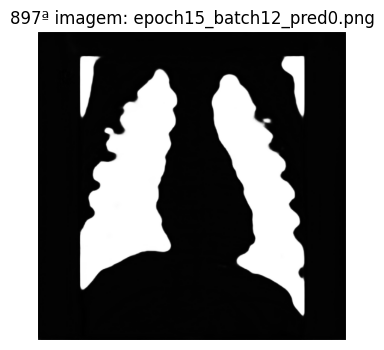

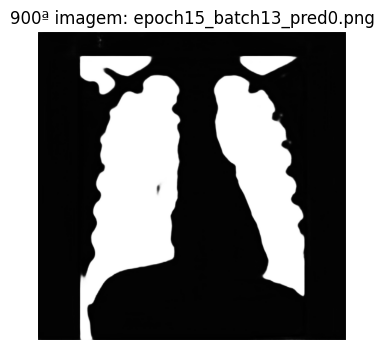

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

dir_path = "/kaggle/working/new_weak_labels"

# lista e ordena os arquivos
files = sorted([f for f in os.listdir(dir_path) if f.lower().endswith((".png", ".jpg", ".jpeg"))])

for idx, fname in enumerate(files):
    # queremos 3,6,9... => em índice Python, isso é 2,5,8...
    if (idx + 1) % 3 == 0:
        img_path = os.path.join(dir_path, fname)
        img = Image.open(img_path)

        plt.figure(figsize=(4,4))
        plt.title(f"{idx+1}ª imagem: {fname}")
        plt.imshow(img, cmap="gray")
        plt.axis("off")
        plt.show()


In [11]:
# Treinamento
for epoch in range(20):
    model.train()
    total = 0
    
    for imgs, masks in train_loader:
        imgs = imgs.to(device)
        masks = masks.to(device)

        preds = model(imgs)            # já sai com sigmoide
        loss_value = loss(preds, masks)

        optimizer.zero_grad()
        loss_value.backward()
        optimizer.step()

        total += loss_value.item()

    print(f"Epoch {epoch+1}: loss = {total / len(train_loader):.4f}")

Epoch 1: loss = 0.5568
Epoch 2: loss = 0.5261
Epoch 3: loss = 0.5182
Epoch 4: loss = 0.5136
Epoch 5: loss = 0.5126
Epoch 6: loss = 0.5103
Epoch 7: loss = 0.5082
Epoch 8: loss = 0.5075
Epoch 9: loss = 0.5063
Epoch 10: loss = 0.5051
Epoch 11: loss = 0.5043
Epoch 12: loss = 0.5042
Epoch 13: loss = 0.5037
Epoch 14: loss = 0.5034
Epoch 15: loss = 0.5029
Epoch 16: loss = 0.5023
Epoch 17: loss = 0.5023
Epoch 18: loss = 0.5024
Epoch 19: loss = 0.5015
Epoch 20: loss = 0.5016
